In [2]:
import numpy as np
import seaborn as sns
import pymc3 as pm
import pandas as pd
import scipy as sp
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
cd ./ont_data_test

/home/jgs/jupyter/ont_data_test


In [4]:
ts = pd.read_table('rawData_colibacillus.txt', names=['current'])

In [8]:
event = pd.read_table('nanopore.tab')

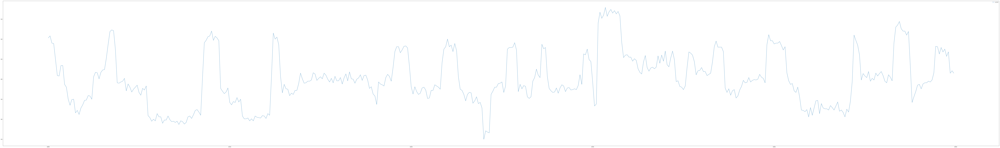

In [5]:
ts[10000:10500].plot(figsize=(200, 30));

In [11]:
event.columns

Index(['sp_m', 'sp_sd', 'er_m', 'er_sd', 'lr_m', 'lr_sd'], dtype='object')

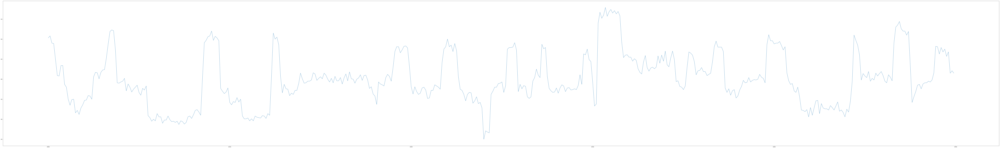

In [6]:
#tr = ts[10000:10100].rolling(window=3, center=True, min_periods=1)
#tss = tr.mean()
tss = ts[10000:10500]
plt.figure(figsize=(200, 30))
plt.plot(tss);

In [44]:
tss.std()

current    64.633178
dtype: float64

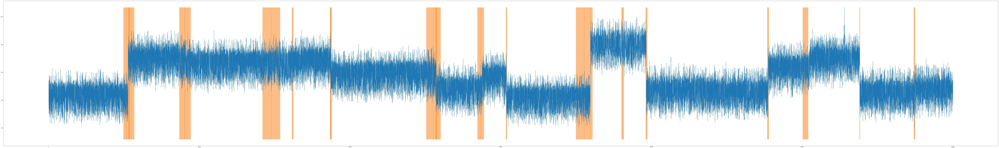

In [35]:
plt.figure(figsize=(200, 30))
plt.plot(ts[:300000])
plt.vlines(vl[:22], ts.min(), ts.max(), color='C1')
std = event[event.sp_sd < 3000][['sp_m', 'sp_sd']].values
for i in std[:22]:
    plt.fill_betweenx(y=[int(ts.min()), int(ts.max())], x1=i[0] - i[1], x2=i[0] + i[1], alpha=0.5, color='C1');

In [ ]:
tr = ts.rolling(window=10, center=True, min_periods=1)
tss = tr.mean()[::10]
vl = event[event.sp_sd < 3000].sp_m.values

In [7]:
def switch_test(current, mu_p, sd_p,sample_num=1000):
    with pm.Model() as switch_point:
        #sps = pm.Poisson('points', 0)
        #ragnes = np.random.randint(years.min(),years.max(), sps)
        current_data = current[0]
        time = current[1]
        switchpoint = pm.DiscreteUniform('switchpoint', lower=time.min(), upper=time.max())

        # Priors for pre- and post-switch rates number of disasters
        early_rate = pm.Normal('early_rate', mu=mu_p, sd=sd_p)
        late_rate = pm.Normal('late_rate', mu=mu_p, sd=sd_p)

        # Allocate appropriate Poisson rates to years before and after current
        rate = pm.math.switch(switchpoint >= time, early_rate, late_rate)

        disasters = pm.Normal('current', mu=rate, sd=70, observed=current_data)
        if sample_num > 5000:
            trace = pm.sample(5000)
        elif sample_num < 100:
            trace = pm.sample(100)
        else:
            trace = pm.sample(sample_num)
            
    return [trace['switchpoint'].mean(), trace['switchpoint'].std(),
            [trace['early_rate'].mean(), trace['early_rate'].std()],
            [trace['late_rate'].mean(), trace['late_rate'].std()]]

In [115]:
#cut1 = [[ts[i:i+2*size].values.T, np.array(ts[i:i+2*size].index)] for i in range(0, 200000,size)]
#test = [switch_test(i) for i in cut1]

#dict(zip(list('abcdfe'),[[i] for i in list('abcde')]))
t = pd.DataFrame(dict(zip(list('abcdfe'),[[i] for i in list('12345')])))
t.head()

,a,b,c,d,f
0,1,2,3,4,5


In [8]:
size_r = 10
cut_r = [[tss[i:i+2*size_r].values.T, np.array(tss[i:i+2*size_r].index)] for i in range(0, len(tss),size_r)]
test_r = [switch_test(i, 400, 70) for i in cut_r];

INFO (theano.gof.compilelock): Waiting for existing lock by process '27780' (I am process '27904')
INFO (theano.gof.compilelock): To manually release the lock, delete /home/jgs/.theano/compiledir_Linux-4.15--generic-x86_64-with-debian-stretch-sid-x86_64-3.7.1-64/lock_dir
Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>Metropolis: [switchpoint]
>NUTS: [late_rate, early_rate]
Sampling 4 chains: 100%|██████████| 6000/6000 [00:02<00:00, 2785.43draws/s]
The number of effective samples is smaller than 10% for some parameters.
Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>Metropolis: [switchpoint]
>NUTS: [late_rate, early_rate]
Sampling 4 chains: 100%|██████████| 6000/6000 [00:01<00:00, 3135.17draws/s]
The number of effective samples is smaller than 10% for some parameters.
Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>Metropolis: [switchpoint]
>NUTS: [late_rate, early_rate]
Sampling 4 chains: 100%|██████████| 6000/6000 [00:01<00:00, 3247.80draws/s]
The number o

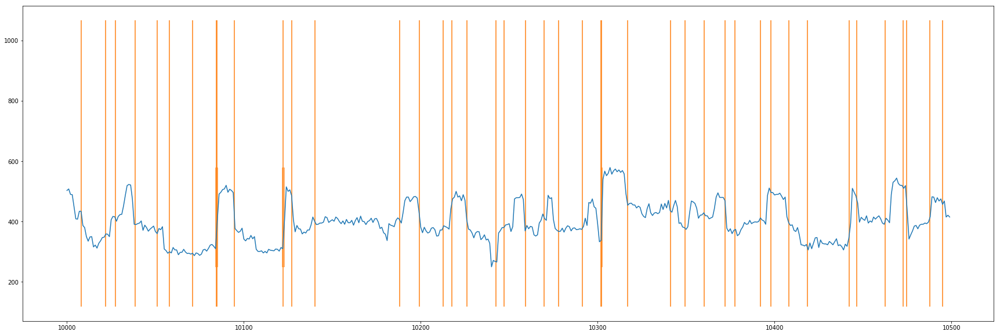

In [9]:
cutoff = 100; pc = 0.3
vl_r = [i[0] for i in test_r if (i[1] < cutoff and sp.stats.ttest_ind_from_stats(i[2][0],i[2][1],20, i[3][0],i[3][1],20).pvalue < pc)]
vs_r = [i[1] for i in test_r if (i[1] < cutoff and sp.stats.ttest_ind_from_stats(i[2][0],i[2][1],20, i[3][0],i[3][1],20).pvalue < pc)]
plt.figure(figsize=(30, 10))
plt.plot(tss)
plt.vlines(vl_r, ts.min(), ts.max(), color='C1')
for i in [i for i in test_r if i[1] < (i[1] < cutoff and sp.stats.ttest_ind_from_stats(i[2][0],i[2][1],20, i[3][0],i[3][1],20).pvalue < pc)]:
    plt.fill_betweenx(y=[int(tss.min()), int(tss.max())], x1=i[0] - i[1], x2=i[0] + i[1], alpha=0.5, color='C1');

In [53]:
[sp.stats.ttest_ind_from_stats(i[2][0],i[2][1],20, i[3][0],i[3][1],20).pvalue for i in test_r]
#sp.stats.ttest_ind_from_stats(312.31810935238167, 28.664221243096918,20,334.8948186531916, 58.711709911568626,20).pvalue

[4.2009070025023256e-15,
 0.00042315079653014497,
 2.151636606299498e-09,
 2.3812514825272024e-09,
 0.00011507670185254385,
 0.004595044170513495,
 0.130549253820294,
 1.3005069707171458e-21,
 2.48768701257524e-16,
 1.5779479899795729e-18,
 0.26379213008223723,
 1.6116916224073665e-20,
 0.015234161377418527,
 0.16618217770770086,
 0.9866081273414737,
 0.7272935021785365,
 0.3781699345613827,
 0.7713011250594355,
 5.1688114071639144e-09,
 4.790427658989028e-12,
 0.00018870831573725795,
 0.024781916456486582,
 2.0347021228470958e-15,
 0.11470502768935457,
 3.8454737288953807e-14,
 0.00887134616999824,
 0.2911936205985595,
 0.00019365398645030662,
 5.722089759427268e-05,
 2.397651446167944e-19,
 1.0696811993746652e-20,
 3.2082179938662828e-12,
 0.6047261311850229,
 0.08003331181673627,
 0.2997814581368004,
 0.035937313673943684,
 1.6083212062578618e-06,
 0.0013273515725375112,
 4.728078171919587e-07,
 0.3230439920595457,
 1.524737320232364e-15,
 0.09596277721997234,
 0.4689934453862209,
 

In [49]:
test_r

[[10007.875,
  2.632655503479329,
  [450.9747743986863, 27.375347469967515],
  [350.0991589796074, 23.23806319832025]],
 [10020.91075,
  5.460886781238007,
  [353.58409776723744, 25.42920118841771],
  [390.8789807448272, 34.89357233033522]],
 [10027.71675,
  3.823809545139506,
  [379.81549177497914, 29.299514347459017],
  [446.9677586780727, 25.050988303555503]],
 [10038.592,
  3.573098935098215,
  [455.11824613487386, 27.373788707708204],
  [389.15239267027744, 26.40027364572388]],
 [10050.843,
  5.121411036032941,
  [381.718204995012, 24.068521315292173],
  [339.63409163769484, 36.565677820394676]],
 [10057.6385,
  6.084062602406389,
  [356.66048655081045, 35.921428880877144],
  [320.9380934765322, 39.01824763414329]],
 [10071.34125,
  6.841403250613137,
  [312.31810935238167, 28.664221243096918],
  [334.8948186531916, 58.711709911568626]],
 [10084.3315,
  0.8013162609107592,
  [311.63972611357514, 18.20797219201361],
  [470.517917831528, 30.94103083900215]],
 [10084.4955,
  1.339581

In [87]:
#size_raw = 20000
#cut_raw = [[ts[i:i+2*size_raw].values.T, np.array(ts[i:i+2*size_raw].index)] for i in range(100000, 200000,size_raw)]
#test_raw = [switch_test(i, size_raw) for i in cut_raw];

In [90]:
from concurrent.futures import ThreadPoolExecutor, ProcessPoolExecutor
import multiprocessing as mp

In [15]:
#with mp.Pool(processes=4) as pool:
#    res = pool.map(switch_test, cut_r)

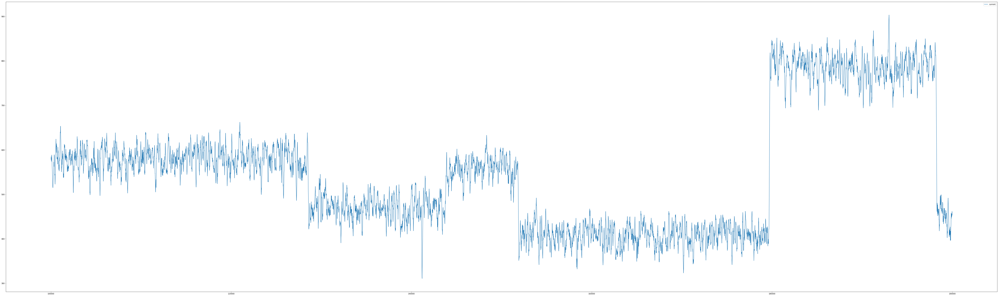

In [54]:
tss[10000:20000].plot(figsize=(100, 30));

In [34]:
vl = [i[0] for i in test if i[1] < 10]
al = [i[0] for i in test if i[1] < 20]
ml = [i[0] for i in test if i[1] < 5]

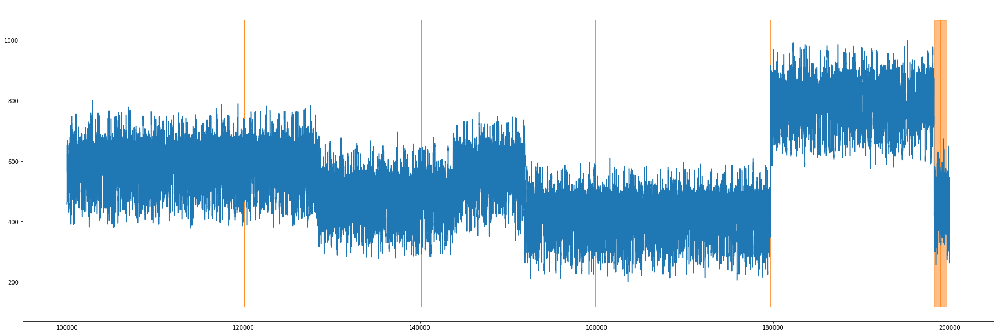

In [85]:
vl_raw = [i[0] for i in test_raw if i[1] < 3000]
vs_raw = [i[1] for i in test_raw if i[1] < 3000]
plt.figure(figsize=(30, 10))
plt.plot(ts[100000:200000])
plt.vlines(vl_raw, ts.min(), ts.max(), color='C1')
for i in [i for i in test_raw if i[1] < 3000]:
    plt.fill_betweenx(y=[int(ts.min()), int(ts.max())], x1=i[0] - i[1], x2=i[0] + i[1], alpha=0.5, color='C1');

In [86]:
test_raw

[[120098.033175,
  64.01205921089692,
  [579.6036406587025, 0.5007539404524227],
  [515.1153315723283, 0.5712224625066137]],
 [140090.7047125,
  46.829975366130014,
  [515.6626846082808, 0.4950202652963456],
  [480.3386631647324, 0.5041493655893277]],
 [159852.529475,
  13.027151692690733,
  [481.1092796186888, 0.4936819742327837],
  [412.58641472504576, 0.4924519839708758]],
 [179720.05075,
  1.241249144007761,
  [407.288961696998, 0.498394162067019],
  [757.8030091206117, 0.49288662018731805]],
 [198953.2299625,
  681.4904532014727,
  [774.8073383143144, 11.50539828901648],
  [455.08516096896165, 0.5291392050769256]]]

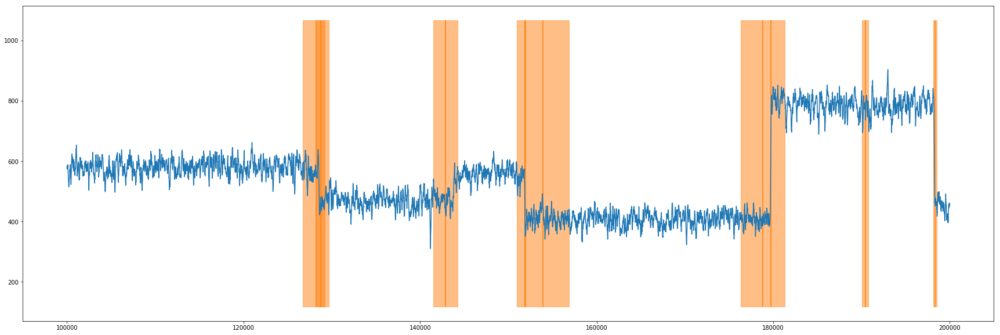

In [75]:
vl_r = [i[0] for i in test_r if i[1] < 3000]
vs_r = [i[1] for i in test_r if i[1] < 3000]
plt.figure(figsize=(30, 10))
plt.plot(tss[10000:20000])
plt.vlines(vl_r, ts.min(), ts.max(), color='C1')
for i in [i for i in test_r if i[1] < 3000]:
    plt.fill_betweenx(y=[int(ts.min()), int(ts.max())], x1=i[0] - i[1], x2=i[0] + i[1], alpha=0.5, color='C1');

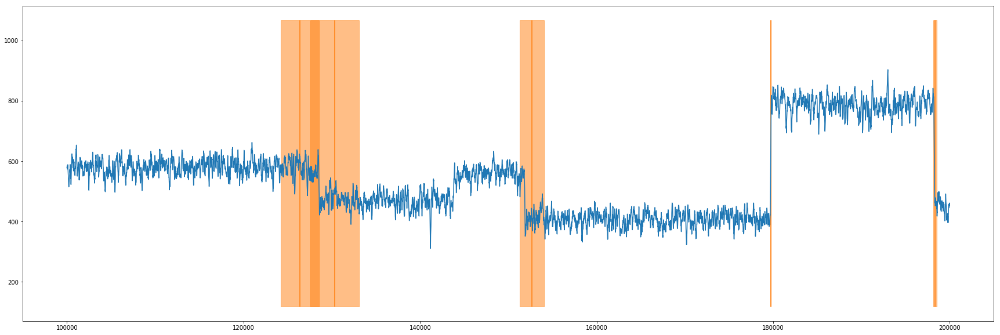

In [77]:
vl_r = [i[0] for i in test_r if i[1] < 3000]
vs_r = [i[1] for i in test_r if i[1] < 3000]
plt.figure(figsize=(30, 10))
plt.plot(tss[10000:20000])
plt.vlines(vl_r, ts.min(), ts.max(), color='C1')
for i in [i for i in test_r if i[1] < 3000]:
    plt.fill_betweenx(y=[int(ts.min()), int(ts.max())], x1=i[0] - i[1], x2=i[0] + i[1], alpha=0.5, color='C1');

In [78]:
[i for i in test_r if i[1] < 3000]

[[126377.8735,
  2177.7758345380153,
  [579.6040666650582, 1.3747303708877987],
  [483.1584713819442, 14.400898270413943]],
 [130339.209,
  2779.68816143448,
  [565.3499370841043, 19.56649018325237],
  [476.51624956695247, 1.4307415768186451]],
 [152654.94975,
  1383.35947776597,
  [523.5761523200377, 10.75319672680989],
  [411.4567197252609, 1.3338498939640917]],
 [179710.87525,
  6.700125926988239,
  [407.3255105532416, 1.5869819180343903],
  [757.6366351156246, 1.5786296502674813]],
 [198313.51375,
  194.20253168004146,
  [785.4119198593295, 3.6261592632771817],
  [455.2769328442964, 1.4767246697584688]]]

In [56]:
b, a = sp.signal.bessel(1, 10, analog=True)
ns = sp.signal.filtfilt(b, a, ts.values, method="gust")
ns1 = pd.DataFrame({'filter_current':[n[0] for n in ns]})

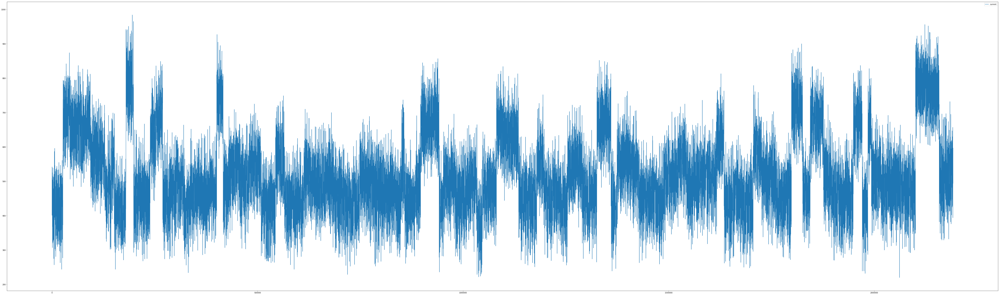

In [53]:
ts[::100].plot(figsize=[100,30])

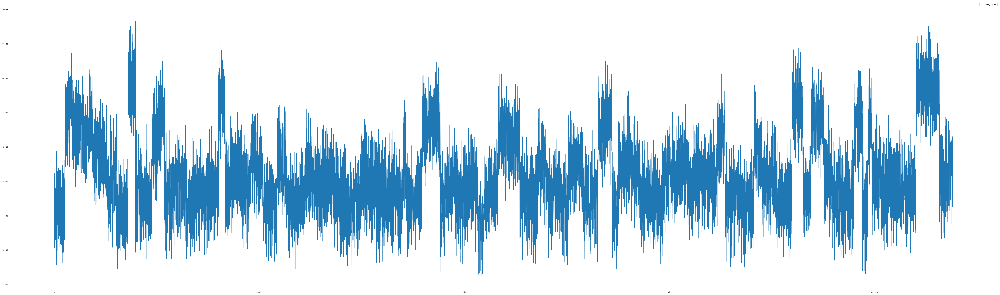

In [57]:
ns1[::100].plot(figsize=[100,30])

In [38]:
tr = ts.rolling(window=100, center=True, min_periods=1)

In [39]:
tss = tr.mean()[::10]
tsv = tr.var()[::10]

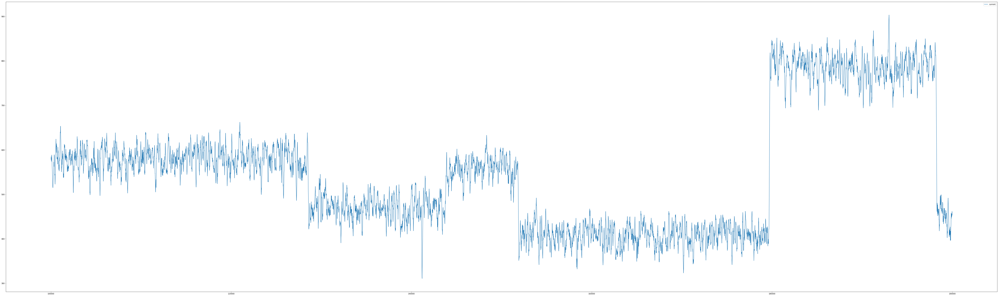

In [14]:
tss[10000:20000].plot(figsize=(100,30))

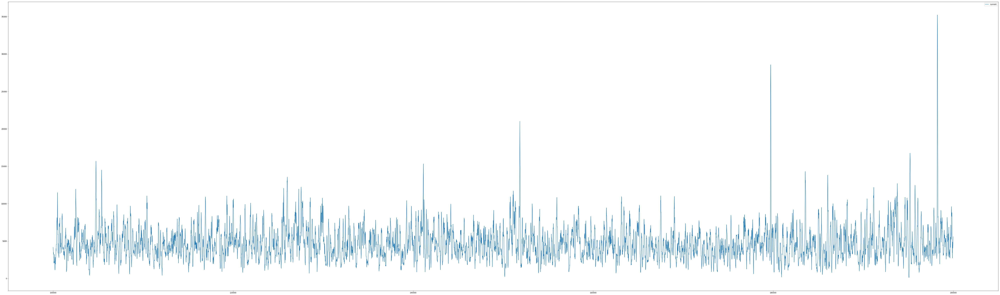

In [7]:
tsv[10000:20000].plot(figsize=(100,30));

In [20]:
with pm.Model() as model:
    step_size = pm.Exponential('sigma', 50.)
    s = pm.GaussianRandomWalk('s', sd=step_size,
                           shape=len(tsv[10000:20000:100].values))

    nu = pm.Exponential('nu', .1)

    r = pm.StudentT('r', nu=nu,
                    lam=pm.math.exp(-2*s),
                    observed=tsv[10000:20000:100].values)

In [17]:
with model:
    trace = pm.sample(tune=2000, nuts_kwargs=dict(target_accept=.9), cores=12)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (12 chains in 12 jobs)
NUTS: [nu, s, sigma]
Sampling 12 chains: 100%|██████████| 30000/30000 [13:42<00:00,  1.81draws/s]
The acceptance probability does not match the target. It is 0.7267094985862336, but should be close to 0.9. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.80845926972121, but should be close to 0.9. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.7864348592839457, but should be close to 0.9. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.9860804367967411, but should be close to 0.9. Try to increase the number of tuning steps.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The acceptance probability does not match the target. It is 0.98496

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f9a21d1b550>,
      dtype=object)

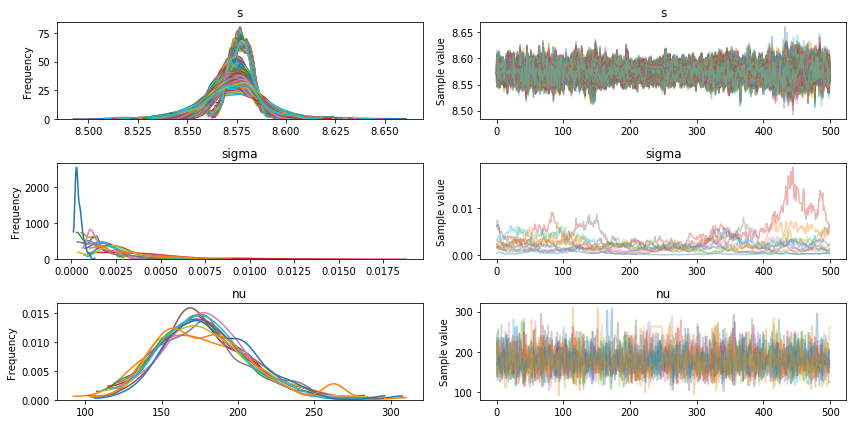

In [22]:
pm.traceplot(trace)

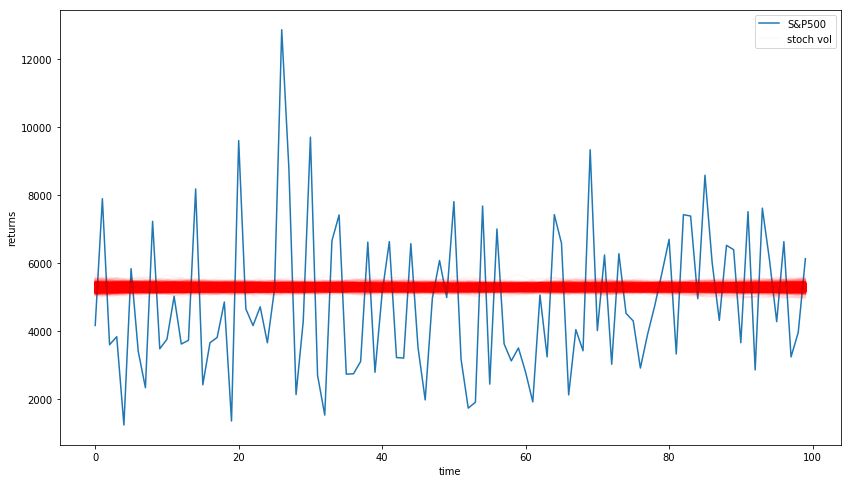

In [21]:
fig, ax = plt.subplots(figsize=(14, 8))
ax.plot(tsv[10000:20000:100].values)
ax.plot(np.exp(trace[s].T), 'r', alpha=.03);
ax.set(xlabel='time', ylabel='returns')
ax.legend(['S&P500', 'stoch vol']);

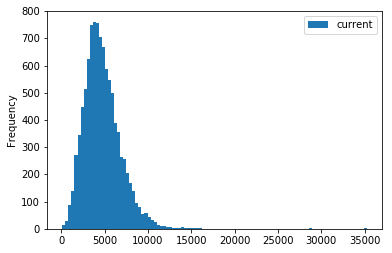

In [22]:
tsv[10000:20000].plot.hist(bins=100)

In [29]:
tsv[10000:20000].mean()

current    4771.533284
dtype: float64

In [25]:
tsv[10000:20000].median()

current    4462.75101
dtype: float64

In [27]:
tsv[10000:20000].std()

current    2250.761697
dtype: float64

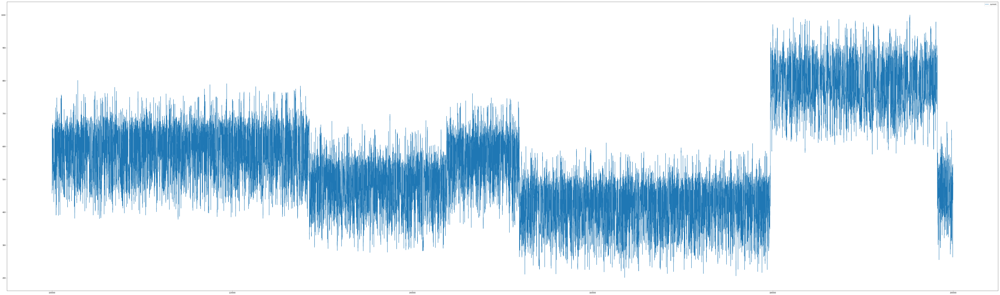

In [12]:
ts[100000:200000].plot(figsize=(100,30))

In [4]:
tssi = ts.copy()

In [5]:
tssir =tssi.rolling(window=100, center=True, min_periods=1).mean()

In [6]:
tssir['time'] = np.random.randn(len(tssir))

In [7]:
tssir.head()

,current,time
0,452.100000,0.041592
1,450.823529,-0.125112
2,449.288462,-0.919410
3,447.962264,-0.684144
4,446.351852,1.238516


In [8]:
corr = tssir.rolling(window=100, center=True, min_periods=1).corr()

In [16]:
corr = corr[corr.index.get_level_values(1) == 'time']

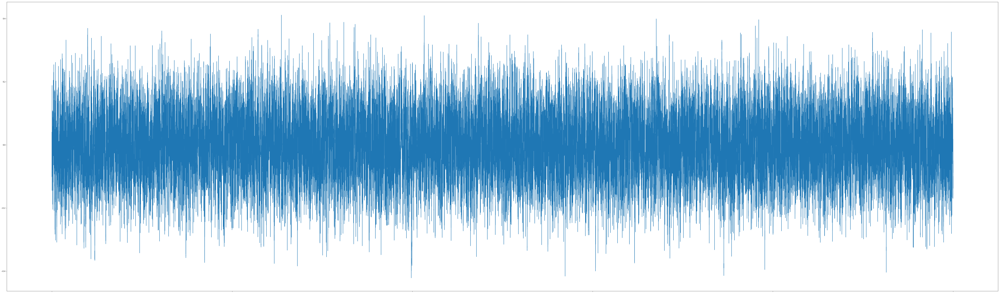

In [29]:
corr.current[:500000].plot(figsize=(100,30))

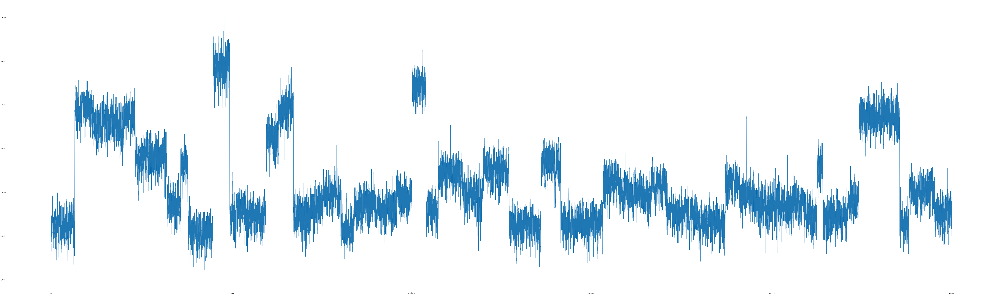

In [41]:
tssir.current[:1000000].plot(figsize=(100,30))

In [46]:
test = tssi.rolling(window=100, center=True, min_periods=1).mean()

In [53]:
import scipy as sp

In [58]:
sp.stats.ttest_rel(np.random.randn(2000),np.random.randn(2000))

Ttest_relResult(statistic=-0.10974378230878773, pvalue=0.9126235923257822)

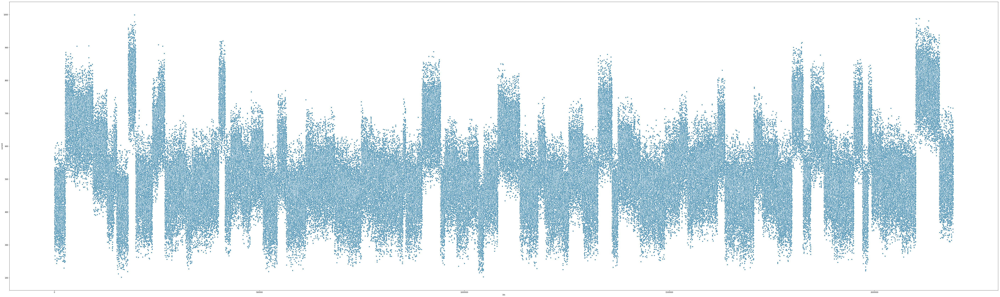

In [105]:
import sklearn as 